# Molecule Property Fitting & Prediction

<a href="https://colab.research.google.com/github/LicoriceLin/NMDA_deeplearning_example/blob/master/unimol-demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Set up the Environments

In [1]:
# @markdown **execute this block to set-up your environment.<br>**
# @markdown in your own worksite, this block could executed once for all.
%%bash

export NCCL_ASYNC_ERROR_HANDLING=1
export OMP_NUM_THREADS=1

cd /content
GIT_REPO='https://github.com/LicoriceLin/Uni-Mol.git'
UNICORE_URL='https://github.com/dptech-corp/Uni-Core/releases/download/0.0.2/unicore-0.0.1+cu113torch1.12.0-cp310-cp310-linux_x86_64.whl'
WEIGHT_URL='https://github.com/dptech-corp/Uni-Mol/releases/download/v0.1/mol_pre_no_h_220816.pt'
if [ ! -f UNIMOL_READY ]; then
  wget -q ${UNICORE_URL}
  pip3 -q install "unicore-0.0.1+cu113torch1.12.0-cp310-cp310-linux_x86_64.whl"
  git clone -b main ${GIT_REPO}
  cd ./Uni-Mol/unimol
  python setup.py develop
  cd -
  pip install -q rdkit
  pip install -q biopandas
  pip install -q py3Dmol
  git clone https://github.com/LicoriceLin/NMDA_deeplearning_example.git
  wget -q ${WEIGHT_URL}

  touch UNIMOL_READY
fi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.2/299.2 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 74.3 MB/s eta 0:00:00
running develop
running egg_info
creating unimol.egg-info
writing unimol.egg-info/PKG-INFO
writing dependency_links to unimol.egg-info/dependency_links.txt
writing requirements to unimol.egg-info/requires.txt
writing top-level names to unimol.egg-info/top_level.txt
writing manifest file 'unimol.egg-info/SOURCES.txt'
reading manifest file 'unimol.egg-info/SOURCES.txt'
writing manifest file 'unimol.egg-info/SOURCES.txt'
running build_ext
Creating /usr/local/lib/python3.10/dist-packages/unimol.egg-link (link to .)
Adding unimol 1.0.0 to easy-install.pth file

Installed /content/Uni-Mol/unimol
Processing dependencies for unimol==1.0.0
Searching for pandas==1.5.3
Best match:

Cloning into 'Uni-Mol'...
/usr/local/lib/python3.10/dist-packages/setuptools/command/develop.py:40: EasyInstallDeprecationWarning: easy_install command is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` and ``easy_install``.
        Instead, use pypa/build, pypa/installer, pypa/build or
        other standards-based tools.

        See https://github.com/pypa/setuptools/issues/917 for details.
        ********************************************************************************

!!
  easy_install.initialize_options(self)
/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/cmd.py:66: SetuptoolsDeprecationWarning: setup.py install is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` directly.
        Instead, use pypa/build, pypa/installer, pypa/build or
        other standards-base

# Pre-process
 You can click on the third button in the left sidebar
 to open the workspace,
 and then drag your files to upload them.<br>



## Parameter
### `skip_preprocess`
check when upload a folder contains .lmdbs in `data_path`

### `data_path`
Acceptable data could be:
 1.  a .csv file (from Excel or any text editor).<br>
 its 1st columns is the smiles string of
 your molelules,<br>
 and the 2rd colum is the target function.
 to fit on(integers or decimals).<br>
 this code will automatically split your input
 into train/valid/test set
 with a ratio of 8:1:1

 2. a folder contains three files: {train,valid,test}.csv.<br>
 all of them should cpmply with the above format.

 3. a folder contains three files: {train,valid,test}.lmdb.<br>
 turn on `skip_preprocess` in this case

### `task_type`
 regression or classification

### `num_classes`
 How many class in claasification task.<br>
 Set to `1` in regression task.


### `seed`
 Random seed (integer) to split train/valid/test set and generate conformation.

## Optional File Operation:
**save the output directory to skip pre-process the next time**.<br>
`data_path`, with suffix removed, will be a directory containing splited .csv, .lmdb and .norm file.<br>


In [31]:
# @markdown **execute this block to set-up data parameter**
# @markdown **and pre-process your data**.
skip_preprocess=True # @param {type:"boolean"}
data_path='/content/NMDA_deeplearning_example/bbb_data' # @param {type:"string"}
task_type='classification' #@param ['classification','regression'] {type:"string"}
num_classes=2 # @param {type:"integer"}
seed=43 # @param {type:"integer"}

import os
os.chdir('/content')
if task_type=='regression' :
  num_classes=1
  cal_norm='--cal-norm'
  loss_func="finetune_mse"
  metric="valid_agg_rmse"
else:
  cal_norm=''
  loss_func="finetune_cross_entropy"
  metric="valid_agg_auc"


if not skip_preprocess:
  print('pre-processing...')
  !python NMDA_deeplearning_example/preprocess.py --data {data_path} \
                     --seed {seed} --split {cal_norm}

if task_type=='regression':
  if data_path.endswith('.csv'):
    norm_path=data_path.replace('.csv','.norm')
  else:
    norm_path=os.path.join(data_path,'.norm')
  with open(norm_path,'r') as f:
    ls=f.readlines()
    mean=float(ls[0].strip('mean: '))
    std=float(ls[1].strip('std: '))
  extra_paras=f"--customized-regression --mean '{mean}' --std '{std}' "
else:
  extra_paras='--maximize-best-checkpoint-metric '

# Training
NOTE: must set essential parameter in Pre-Porcess and dry-run it by checking skip_preprocess
### `skip_training`
dry-run to set-up parameters for training profiling.<br>
useful when resuming your training states.
### `fintune_weight_path`
path to pretrained model
### `only_polar`
corresponding to your pretrained model
### `batch_size`
change when cuda memory is under- or over- used.
### `epoch`
max epoch to train.<br>
an epoch is a complete iteration through the entire dataset.<br>
more epoch is suggested with larger dataset.<br>
by profiling training, you may explore a suitable range of epochs.

NOTE:<br>
early stop is possible <br>
if valid performance stops optimization for 20 epochs.

### `keep_last_epochs`
how many checkpoint models to keep.<br>

### `lr`
learning rate,ratio between parameter increments and backward gradients.

### `dropout`
rate to radomly leave-out parameter to avoid overfitting.

### `warmup`
at the very few training steps, changing the learning rate
 according to this ratio.

## Optional File Operation:
**save the output directory to skip training the next time**.<br>
dir/contains/lmdb + "_result" will store models and logs.
they are highly valuable for prediction.
Note: regression model must be used with the .norm file.

In [32]:
# @markdown **execute this block to train a neural network.**
import os, sys,shutil

skip_training=False # @param {type:"boolean"}
fintune_weight_path='/content/mol_pre_no_h_220816.pt' # @param {type:"string"}
only_polar=0# @param {type:"number"}
batch_size=32 # @param {type:"number"}
epoch=15 # @param {type:"integer"}
keep_last_epochs=15 #@param {type:"integer"}

assert keep_last_epochs<=epoch, 'no enough epoch to keep!'
lr=1e-4# @param {type:"number"}
dropout=0.1# @param {type:"number"}
warmup=0.06# @param {type:"number"}

# freezed parameters
num_workers=0
n_gpu=1
local_batch_size=batch_size
conf_size=11
dict_name='/content/Uni-Mol/unimol/example_data/molecule/dict.txt'

#processing
update_freq=int(batch_size / local_batch_size)
_=(data_path.replace('.csv',''))
for i in ['train','valid']:
  f=os.path.join(_,f'{i}.lmdb')
  assert os.path.isfile(f),(f'missing required file:\n{f}.\n'
  ' preprocess needed maybe?')
data_dir,task_name=os.path.split(_)
if not data_dir:
  data_dir='.'
save_dir=os.path.join(data_dir,f'{task_name}_result')

os.environ['LOCAL_RANK'] = '1'
if not skip_training:
  if os.path.isdir(save_dir):
    shutil.rmtree(save_dir)
  os.makedirs(save_dir,exist_ok=True)
  !python -m torch.distributed.launch --nproc_per_node=$n_gpu --master_port 10086 --use_env \
      $(which unicore-train) $data_dir --task-name $task_name --user-dir ./Uni-Mol/unimol \
        --train-subset train --valid-subset valid \
        --conf-size $conf_size \
        --num-workers $num_workers --ddp-backend=c10d \
        --dict-name $dict_name \
        --task mol_finetune --loss $loss_func --arch unimol_base  \
        --classification-head-name $task_name --num-classes $num_classes \
        --optimizer adam --adam-betas '(0.9, 0.99)' --adam-eps 1e-6 --clip-norm 1.0 \
        --lr-scheduler polynomial_decay --lr $lr --warmup-ratio $warmup --max-epoch $epoch \
        --batch-size $local_batch_size --pooler-dropout $dropout \
        --update-freq $update_freq --seed $seed \
        --fp16 --fp16-init-scale 4 --fp16-scale-window 256 \
        --log-interval 100 --log-format simple \
        --validate-interval 1 --keep-last-epochs $keep_last_epochs \
        --finetune-from-model $fintune_weight_path \
        --best-checkpoint-metric $metric --patience 20 \
        --save-dir $save_dir --only-polar $only_polar \
        --tensorboard-logdir $save_dir

/usr/local/lib/python3.10/dist-packages/torch/distributed/launch.py:181: FutureWarning: The module torch.distributed.launch is deprecated
and will be removed in future. Use torchrun.
Note that --use-env is set by default in torchrun.
If your script expects `--local-rank` argument to be set, please
change it to read from `os.environ['LOCAL_RANK']` instead. See 
https://pytorch.org/docs/stable/distributed.html#launch-utility for 
further instructions

  warnings.warn(
2023-06-18 14:32:16.264293: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-18 14:32:17.180062: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
fused_multi_tensor is not installed corrected
fused_rounding is not installed corrected
fused

#Monitor your training


In [33]:
# @markdown **execute this block to visual check in Tensorboard**
%load_ext tensorboard
%tensorboard --logdir $save_dir

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 35306), started 0:27:40 ago. (Use '!kill 35306' to kill it.)

<IPython.core.display.Javascript object>

In [34]:
# @markdown **execute this block to profile training on a given dataset**
# @markdown ### `test_file`
# @markdown profile the performance of each model checkpoint with a given data set.<br>
# @markdown leave empty if you want to run it on your training set.
test_file='/content/NMDA_deeplearning_example/bbb_data/valid.lmdb' # @param {type:"string"}


import pandas as pd
from glob import glob
import re

infer_extra_paras='' if task_type=='classification' else extra_paras
print(f'profile models in {save_dir}...')

def sort_key(s):
    match = re.match(r'([\w/]+checkpoint)((\d+)|(_.+))\.pt', s)
    if match:
        prefix = match.group(1)
        if match.group(2).startswith('_'):
            return (1, match.group(2))

        else:
            return (0, int(match.group(2)))
    return (2, s)
def split_testfile(test_file:str):
    _,subset=os.path.split(test_file)
    subset=subset.replace('.lmdb','')
    result_path=os.path.join(_,subset+'_result')
    data_path,task_name=os.path.split(_)
    return data_path,task_name,subset,result_path

def split_list_col(df:pd.DataFrame,column_to_split:str):
    where_column_to_split=df.columns.get_loc(column_to_split)
    column_data = df.pop(column_to_split)
    try:
      try:
        len_column_data=len(column_data[0])
      except:
        len_column_data=1
      split_columns = pd.DataFrame(column_data.tolist(),
                        columns=[f'{column_to_split}_{i + 1}'
                        for i in range(len_column_data)])
    except:
      import pdb;pdb.set_trace()
    df_out = pd.concat([df.iloc[:, :where_column_to_split],
                        split_columns, df.iloc[:, where_column_to_split:]], axis=1)
    return df_out

def get_csv_results(predict_path):
  predict = pd.read_pickle(predict_path)
  smi_list, predict_list,target_list = [], [], []
  for batch in predict:
      sz = batch["bsz"]
      infer_name='prob' if task_type=='classification' else 'predict'
      for i in range(sz):
        smi_list.append(batch["smi_name"][i])
        predict_list.append(batch[infer_name][i].tolist())
        target_list.append(batch['target'][i].tolist())
  predict_df = pd.DataFrame({"SMILES": smi_list, "predict": predict_list,"target":target_list})
  predict_df=split_list_col(predict_df,"predict")
  if task_type=='regression':
    predict_df=split_list_col(predict_df,"target")

  predict_df = predict_df.groupby("SMILES")[
      [i for i in predict_df if i !='SMILES']].mean().reset_index()
  predict_df.to_csv(predict_path.replace('.out.pkl','.full.csv'),index=False)

  if task_type=='classification':
    demo_predict_list = [i[1] for i in predict_list]
    demo_target_list = [i for i in target_list]
  else:
    demo_predict_list = [i[0] for i in predict_list]
    demo_target_list = [i[0] for i in target_list]
  demo_predict_df = pd.DataFrame({"SMILES": smi_list, "predict":demo_predict_list ,"target":demo_target_list})
  demo_predict_df = demo_predict_df.groupby("SMILES")[["predict","target"]].mean().reset_index()
  demo_predict_df.to_csv(predict_path.replace('.out.pkl','.csv'),index=False)
  return demo_predict_df

if not test_file:
  test_file=os.path.join(data_path.replace('.csv',''),'train.lmdb')
if test_file.endswith('.lmdb'):
  (test_data_path,test_task_name,
  test_subset,test_result_path)=split_testfile(test_file)
elif test_file.endswith('.csv'):
  _=test_file.replace('.csv','.lmdb')
  if not os.path.isfile(_):
    flags=f'-data {test_file} --seed {seed}'
    !python NMDA_deeplearning_example/preprocess.py $flags
  (test_data_path,test_task_name,
  test_subset,test_result_path)=split_testfile(_)
else:
  raise ValueError

dfs={}
# for i in range(11,21):
pts=glob(os.path.join(save_dir,f'*.pt'))
pts.sort(key=sort_key)
for infer_weight_path in pts:
  id=os.path.basename(infer_weight_path).replace('.pt','')
  flags=f'''--user-dir /content/Uni-Mol/unimol/unimol {test_data_path} \
    --task-name {test_task_name} --valid-subset {test_subset} \
    --results-path {test_result_path} \
    --num-workers 8 --ddp-backend=c10d --batch-size {batch_size} \
    --task mol_finetune --loss {loss_func} --arch unimol_base \
    --classification-head-name {task_name} --num-classes {num_classes} \
    --dict-name {dict_name} --conf-size {conf_size} \
    --only-polar {only_polar}  \
    --path {infer_weight_path}  \
    --fp16 --fp16-init-scale 4 --fp16-scale-window 256 \
    --log-interval 50 --log-format simple {infer_extra_paras}'''

  !python /content/Uni-Mol/unimol/unimol/infer.py $flags

  fname = infer_weight_path.split("/")[-2]
  save_path = os.path.join(test_result_path,
          fname + "_" + test_subset + ".out.pkl")
  tmp_save_path=save_path.replace(".out.pkl",f".{id}.out.pkl")
  shutil.move(save_path,tmp_save_path)
  dfs[id]=get_csv_results(tmp_save_path)

profile models in /content/NMDA_deeplearning_example/bbb_data_result...
2023-06-18 14:40:51.472992: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-18 14:40:53.104522: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
fused_multi_tensor is not installed corrected
fused_rounding is not installed corrected
fused_layer_norm is not installed corrected
fused_softmax is not installed corrected
2023-06-18 14:40:55 | INFO | unimol.inference | loading model(s) from /content/NMDA_deeplearning_example/bbb_data_result/checkpoint1.pt
2023-06-18 14:40:58 | INFO | unimol.tasks.unimol_finetune | dictionary: 30 types
2023-06-18 14:40:59 | INFO | unimol.inference | Namespace(no_progress_bar=False, log_interval=50, log_

In [35]:
# @markdown **execute this block to visual check one pieces (checkpoint_best) of the profilings**
dfs['checkpoint_best']

,SMILES,predict,target
0,C(C(C(OCOC(C(C)(C)C)=O)=O)CCC)CC,0.950495,1.0
1,C(C(C)(C)O)C,0.988104,1.0
2,C(C(C=C)N)CC(O)=O,0.942414,1.0
3,C(C1=CC=CC=C1O)(=O)N,0.968837,1.0
4,C(C1OC(C(C)C)(C(C)C)OC1)O,0.971456,1.0
...,...,...,...
199,c1(ccc(c(c1)Cl)Cl)CC(N1[C@@H](c2c(CC1)occ2)C[N...,0.857474,1.0
200,c1(ccc(c(c1)Cl)Cl)CC(N1[C@@H](c2c(CC1)scc2)CN1...,0.951945,1.0
201,c1(ccccc1)CC(N1[C@H](CN(CC1)C(=O)C)C[N@]1CC[C@...,0.852483,0.0
202,c12c(C(N(Cc3n1cnc3c1noc(n1)C(O)(C)C)C)=O)c(ccc...,0.757462,0.0


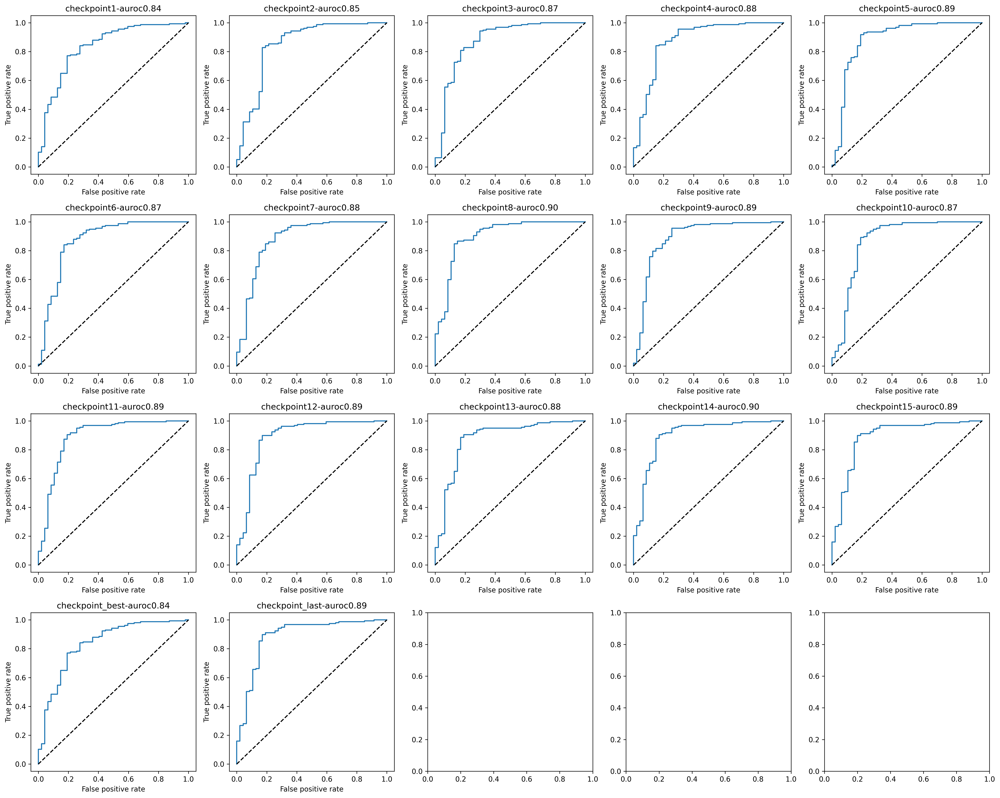

In [36]:
# @markdown **execute this block to plot all profilings**
import matplotlib.pyplot as plt
import scipy
from math import ceil
from sklearn.metrics import (roc_curve, roc_auc_score, r2_score,mean_squared_error,
                average_precision_score, confusion_matrix, ConfusionMatrixDisplay)
pt_counts=len(glob(os.path.join(save_dir,f'*.pt')))
rows=ceil(pt_counts/5)
fig, axes = plt.subplots(rows, 5, figsize=(20, rows*4))
i=0

for id,df, ax in zip(dfs.keys(),dfs.values(), axes.flatten()):
  if task_type=='regression':

    ax.scatter(df['target'], df['predict'])
    min_max_=[df['target'].min(),df['target'].max()]
    ax.plot(min_max_,min_max_,'--',c='grey',label='x=y')

    ax.set_xlabel('target')
    ax.set_ylabel('predict')
    r=r2_score(df['predict'],df['target'])
    rmse=mean_squared_error(df['predict'],df['target'])
    ax.set_title(f'{id}-rmse{rmse:.2f}')
  else:
    fpr, tpr, _ = roc_curve(df['target'], df['predict'])
    ax.plot(fpr, tpr)
    ax.plot([0, 1], [0, 1], 'k--')

    ax.set_xlabel('False positive rate')
    ax.set_ylabel('True positive rate')
    auroc = roc_auc_score(df['target'], df['predict'])
    ax.set_title(f'{id}-auroc{auroc:.2f}')

plt.tight_layout()
fig.set_dpi(300)
plt.show()

# Inference
if you already have the .pt model file,<br>
you could skip all protocols above to run inference,

NOTE:<br>
1. find description of the parameter in training protocol.
2. you may not don't have the ground truth value of you data,<br>
but you must impute a columns of ground truth of pseudo values <br>
(e.g., all zeros).



In [37]:
# @markdown **execute this block to run predictions.**
task_type='classification' #@param ['classification','regression'] {type:"string"}
num_classes=2 # @param {type:"integer"}
data_path='/content/NMDA_deeplearning_example/bbb_data/test.lmdb' # @param {type:"string"}
infer_weight_path='/content/NMDA_deeplearning_example/bbb_data_result/checkpoint_last.pt' # @param {type:"string"}
only_polar=0 # @param {type:"string"}
norm_path='/content/NMDA_deeplearning_example/qsar_data/.norm' # @param {type:"string"}
seed=42 # @param {type:"integer"}
dict_name='/content/Uni-Mol/unimol/example_data/molecule/dict.txt'
batch_size=16

import pandas as pd
from glob import glob
import re,os,shutil
import matplotlib.pyplot as plt
from sklearn.metrics import (roc_curve, roc_auc_score, precision_recall_curve,
                average_precision_score, confusion_matrix, ConfusionMatrixDisplay)

def sort_key(s):
    match = re.match(r'([\w/]+checkpoint)((\d+)|(_.+))\.pt', s)
    if match:
        prefix = match.group(1)
        if match.group(2).startswith('_'):
            return (1, match.group(2))

        else:
            return (0, int(match.group(2)))
    return (2, s)

def split_testfile(test_file:str):
    _,subset=os.path.split(test_file)
    subset=subset.replace('.lmdb','')
    result_path=os.path.join(_,subset+'_result')
    data_path,task_name=os.path.split(_)
    return data_path,task_name,subset,result_path

def split_list_col(df:pd.DataFrame,column_to_split:str):
    where_column_to_split=df.columns.get_loc(column_to_split)
    column_data = df.pop(column_to_split)
    try:
      try:
        len_column_data=len(column_data[0])
      except:
        len_column_data=1
      split_columns = pd.DataFrame(column_data.tolist(),
                        columns=[f'{column_to_split}_{i + 1}'
                        for i in range(len_column_data)])
    except:
      import pdb;pdb.set_trace()
    df_out = pd.concat([df.iloc[:, :where_column_to_split],
                        split_columns, df.iloc[:, where_column_to_split:]], axis=1)
    return df_out

def get_csv_results(predict_path):
  predict = pd.read_pickle(predict_path)
  smi_list, predict_list,target_list = [], [], []
  for batch in predict:
      sz = batch["bsz"]
      infer_name='prob' if task_type=='classification' else 'predict'
      for i in range(sz):
        smi_list.append(batch["smi_name"][i])
        predict_list.append(batch[infer_name][i].tolist())
        target_list.append(batch['target'][i].tolist())
  predict_df = pd.DataFrame({"SMILES": smi_list, "predict": predict_list,"target":target_list})
  predict_df=split_list_col(predict_df,"predict")
  if task_type=='regression':
    predict_df=split_list_col(predict_df,"target")

  predict_df = predict_df.groupby("SMILES")[
      [i for i in predict_df if i !='SMILES']].mean().reset_index()
  predict_df.to_csv(predict_path.replace('.out.pkl','.full.csv'),index=False)

  if task_type=='classification':
    demo_predict_list = [i[1] for i in predict_list]
    demo_target_list = [i for i in target_list]
  else:
    demo_predict_list = [i[0] for i in predict_list]
    demo_target_list = [i[0] for i in target_list]
  demo_predict_df = pd.DataFrame({"SMILES": smi_list, "predict":demo_predict_list ,"target":demo_target_list})
  demo_predict_df = demo_predict_df.groupby("SMILES")[["predict","target"]].mean().reset_index()
  demo_predict_df.to_csv(predict_path.replace('.out.pkl','.csv'),index=False)
  return demo_predict_df


if task_type=='regression' :
  loss_func="finetune_mse"
else:
  loss_func="finetune_cross_entropy"

conf_size=11

if task_type=='regression':
    with open(norm_path,'r') as f:
        ls=f.readlines()
        mean=float(ls[0].strip('mean: '))
        std=float(ls[1].strip('std: '))
    infer_extra_paras=f"--customized-regression --mean '{mean}' --std '{std}' "
else:
    infer_extra_paras=''

if data_path.endswith('.lmdb'):
  (test_data_path,test_task_name,
  test_subset,test_result_path)=split_testfile(data_path)
elif data_path.endswith('.csv'):
  _=data_path.replace('.csv','.lmdb')
  if not os.path.isfile(_):
    flags=f'-data {data_path} --seed {seed}'
    !python NMDA_deeplearning_example/preprocess.py $flags
  (test_data_path,test_task_name,
  test_subset,test_result_path)=split_testfile(_)
else:
  raise ValueError

id=os.path.basename(infer_weight_path).replace('.pt','')
flags=f'''--user-dir /content/Uni-Mol/unimol/unimol {test_data_path} \
  --task-name {test_task_name} --valid-subset {test_subset} \
  --results-path {test_result_path} \
  --num-workers 8 --ddp-backend=c10d --batch-size {batch_size} \
  --task mol_finetune --loss {loss_func} --arch unimol_base \
  --classification-head-name {test_task_name} --num-classes {num_classes} \
  --dict-name {dict_name} --conf-size {conf_size} \
  --only-polar {only_polar}  \
  --path {infer_weight_path}  \
  --fp16 --fp16-init-scale 4 --fp16-scale-window 256 \
  --log-interval 50 --log-format simple {infer_extra_paras}'''

!python /content/Uni-Mol/unimol/unimol/infer.py $flags

fname = infer_weight_path.split("/")[-2]
save_path = os.path.join(test_result_path,
        fname + "_" + test_subset + ".out.pkl")
tmp_save_path=save_path.replace(".out.pkl",f".{id}.out.pkl")
shutil.move(save_path,tmp_save_path)
infer_result=get_csv_results(tmp_save_path)

2023-06-18 14:45:23.938210: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-18 14:45:24.852355: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
fused_multi_tensor is not installed corrected
fused_rounding is not installed corrected
fused_layer_norm is not installed corrected
fused_softmax is not installed corrected
2023-06-18 14:45:27 | INFO | unimol.inference | loading model(s) from /content/NMDA_deeplearning_example/bbb_data_result/checkpoint_last.pt
2023-06-18 14:45:27 | INFO | unimol.tasks.unimol_finetune | dictionary: 30 types
2023-06-18 14:45:29 | INFO | unimol.inference | Namespace(no_progress_bar=False, log_interval=50, log_format='simple', tensorboard_logdir='', seed=1, cpu=False, fp16=True

In [38]:
# @markdown **execute this block to check your predictions in a table.**
infer_result

,SMILES,predict,target
0,C(C(C(CC)C)C(N)=O)C,0.999875,1.0
1,C(C(C(N)=O)(CCC)CCC)CC,0.999872,1.0
2,C(C(CCCC)CC)NC(CC(C)O)=O,0.999830,1.0
3,C(C1(C(NC(=O)NC1=O)=O)C(C)C)C=C,0.999815,1.0
4,C(C2C1C(NC(N1)=O)CS2)CCCC(O)=O,0.005276,1.0
...,...,...,...
201,c1(ccc(c(c1)Cl)Cl)CC(N1[C@@H](c2c(CC1)[nH]cn2)...,0.999196,0.0
202,c1(ccc(c(c1)Cl)Cl)CC(N1[C@H](C[N@@]2C[C@@H](CC...,0.001061,0.0
203,c1ccc(C(NCCCOc2cc(CN3CCCCC3)ccc2)=O)cc1,0.999848,1.0
204,c1ccc2Oc3c(cc(cc3)Cl)[C@@H]3[C@@H](c2c1)C[N@](...,0.999858,1.0


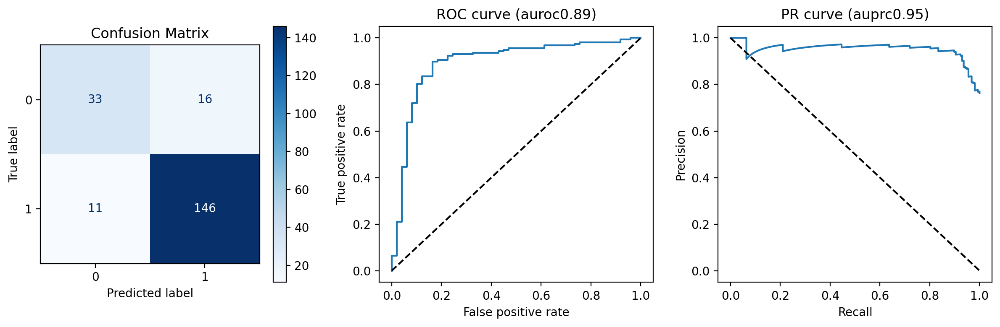

In [39]:
# @markdown **execute this block to plot your prediction.**
if task_type=='regression':
    fig, axes = plt.subplots(1, 1, figsize=(6, 6))
    axes.scatter(infer_result['target'], infer_result['predict'])
    min_max_ = [infer_result['target'].min(),infer_result['target'].max()]
    axes.plot(min_max_,min_max_,'--',c='grey',label='x=y')

    axes.set_xlabel('target')
    axes.set_ylabel('predict')
    r = r2_score(df['predict'],df['target'])
    rmse = mean_squared_error(df['predict'],df['target'])
    axes.set_title(f'rmse{rmse:.2f}')
    fig.set_dpi(200)
else:
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    fpr, tpr, _ = roc_curve(infer_result['target'], infer_result['predict'])


    pred_label = [1 if i > 0.1 else 0 for i in infer_result['predict']]
    cm = confusion_matrix(infer_result['target'], pred_label)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['0', '1'])
    disp.plot(cmap='Blues', values_format='.0f',ax=axes[0])
    axes[0].set_title('Confusion Matrix')

    axes[1].plot(fpr, tpr)
    axes[1].plot([0, 1], [0, 1], 'k--')
    axes[1].set_xlabel('False positive rate')
    axes[1].set_ylabel('True positive rate')
    auroc = roc_auc_score(infer_result['target'], infer_result['predict'])
    axes[1].set_title(f'ROC curve (auroc{auroc:.2f})')

    auprc = average_precision_score(
        infer_result['target'], infer_result['predict'])
    precision, recall, _ = precision_recall_curve(
        infer_result['target'], infer_result['predict'])
    axes[2].plot(recall, precision, label=f"PR curve (AUPRC={auprc:.2f})")
    axes[2].set_xlabel('Recall')
    axes[2].set_ylabel('Precision')
    axes[2].set_title(f'PR curve (auprc{auprc:.2f})')
    axes[2].plot([0, 1], [1, 0], 'k--')

    fig.set_dpi(200)
plt.tight_layout()
plt.show()